In [2]:
!pip install yfinance
!pip install pandas_ta
!pip install vectorbt
!pip install pyfolio-reloaded

In [3]:
import pandas as pd
import numpy as np
import pandas_ta as ta
import vectorbt as vbt
import yfinance as yf
import matplotlib.pyplot as plt

In [4]:
start_date = '2020-01-01'
end_date = '2022-01-01'

In [5]:
df = yf.download(tickers='BTC-USD', start = start_date, end = end_date, interval = '1d')
df.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-01-01,7194.892090,7254.330566,7174.944336,7200.174316,7200.174316,18565664997
2020-01-02,7202.551270,7212.155273,6935.270020,6985.470215,6985.470215,20802083465
2020-01-03,6984.428711,7413.715332,6914.996094,7344.884277,7344.884277,28111481032
2020-01-04,7345.375488,7427.385742,7309.514160,7410.656738,7410.656738,18444271275
2020-01-05,7410.451660,7544.497070,7400.535645,7411.317383,7411.317383,19725074095


In [6]:
# Initial Indicator
df['fast_ema'] = df.ta.ema(9)
df['slow_ema'] = df.ta.ema(30)

# Define Signal
df['long_trigger'] = df['fast_ema'].vbt.crossed_above(df['slow_ema'])

df['short_trigger'] = df['fast_ema'].vbt.crossed_below(df['slow_ema'])

long_entries = df['long_trigger'] 
#short_entries = df['short_trigger'] 
long_exits = df['short_trigger'] 
#short_exits = df['long_trigger'] 

#Define Strategy
Trading System Metric
net PnL
Conseccutive win/loss
avg win/loss
max win/loss
CAGR (Compound Annual Growth Rate)
Maximum Drawdown
Sharpe Ratio
Recovery Factor
Risk Metric
Volatility
NAV
Vectorbt call trade log for analyst

In [7]:
df

,Open,High,Low,Close,Adj Close,Volume,fast_ema,slow_ema,long_trigger,short_trigger
Date,,,,,,,,,,
2020-01-01,7194.892090,7254.330566,7174.944336,7200.174316,7200.174316,18565664997,NaN,NaN,False,False
2020-01-02,7202.551270,7212.155273,6935.270020,6985.470215,6985.470215,20802083465,NaN,NaN,False,False
2020-01-03,6984.428711,7413.715332,6914.996094,7344.884277,7344.884277,28111481032,NaN,NaN,False,False
2020-01-04,7345.375488,7427.385742,7309.514160,7410.656738,7410.656738,18444271275,NaN,NaN,False,False
2020-01-05,7410.451660,7544.497070,7400.535645,7411.317383,7411.317383,19725074095,NaN,NaN,False,False
...,...,...,...,...,...,...,...,...,...,...
2021-12-27,50802.609375,51956.328125,50499.468750,50640.417969,50640.417969,24324345758,49795.109175,50892.561146,False,False
2021-12-28,50679.859375,50679.859375,47414.210938,47588.855469,47588.855469,33430376883,49353.858434,50679.418844,False,False
2021-12-29,47623.871094,48119.742188,46201.496094,46444.710938,46444.710938,30049226299,48772.028935,50406.211882,False,False


In [9]:
df[df['long_trigger']==True]

,Open,High,Low,Close,Adj Close,Volume,fast_ema,slow_ema,long_trigger,short_trigger
Date,,,,,,,,,,
2020-04-08,7179.283203,7356.223633,7153.305664,7334.098633,7334.098633,37563249549,6941.453329,6901.765274,True,False
2020-04-16,6640.454102,7134.450684,6555.504395,7116.804199,7116.804199,46783242377,6914.253734,6909.698551,True,False
2020-07-22,9375.080078,9530.518555,9319.653320,9525.363281,9525.363281,16532254884,9285.859132,9267.700283,True,False
2020-10-09,10927.913086,11102.671875,10846.850586,11064.458008,11064.458008,22799117613,10788.895996,10766.060287,True,False
2021-05-07,56413.953125,58606.632812,55321.847656,57356.402344,57356.402344,68434023376,56198.405767,56089.554775,True,False
2021-07-26,35384.031250,40499.675781,35287.312500,37337.535156,37337.535156,51022126212,33988.926192,33802.596282,True,False
2021-09-15,47098.000000,48450.468750,46773.328125,48176.347656,48176.347656,30484496466,46949.993072,46788.404830,True,False
2021-10-03,47680.027344,49130.691406,47157.289062,48199.953125,48199.953125,26638115879,45446.726230,45325.051240,True,False


In [10]:
df[df['short_trigger']==True]

,Open,High,Low,Close,Adj Close,Volume,fast_ema,slow_ema,long_trigger,short_trigger
Date,,,,,,,,,,
2020-02-27,8825.093750,8932.892578,8577.199219,8784.494141,8784.494141,45470195695,9371.075275,9435.015849,False,True
2020-04-15,6845.561523,6928.664551,6633.402832,6642.109863,6642.109863,32288311031,6863.616118,6895.415402,False,True
2020-06-26,9260.995117,9310.516602,9101.738281,9162.917969,9162.917969,18341465837,9365.772978,9396.069864,False,True
2020-09-03,11407.191406,11443.022461,10182.464844,10245.296875,10245.296875,31927261555,11350.105047,11377.684806,False,True
2021-04-21,56471.128906,56757.972656,53695.468750,53906.089844,53906.089844,54926612466,57719.222851,57792.512580,False,True
2021-05-12,56714.531250,57939.363281,49150.535156,49150.535156,49150.535156,75215403907,55248.181148,55913.307191,False,True
2021-09-13,46057.214844,46598.679688,43591.320312,44963.074219,44963.074219,40969943253,46531.132485,46665.111700,False,True
2021-09-20,47261.406250,47328.199219,42598.914062,42843.800781,42843.800781,43909845642,46449.206186,46720.979226,False,True
2021-11-19,56896.128906,58351.113281,55705.179688,58119.578125,58119.578125,38702407772,60971.756229,61132.363526,False,True


<AxesSubplot:xlabel='Date'>

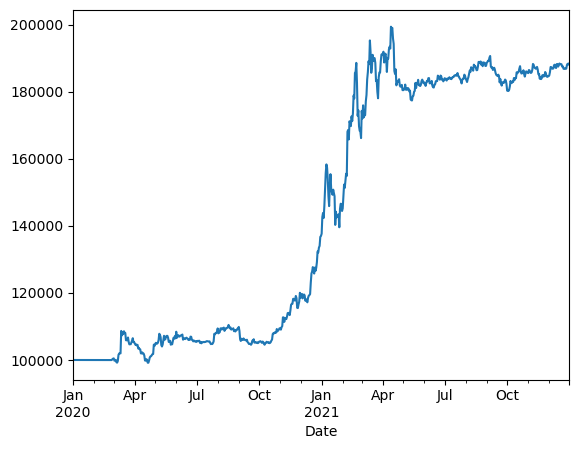

In [5]:
# Initial Indicator
df['fast_ema'] = df.ta.ema(9)
df['slow_ema'] = df.ta.ema(30)

# Define Signal
df['long_trigger'] = df['fast_ema'].vbt.crossed_above(df['slow_ema'])

df['short_trigger'] = df['fast_ema'].vbt.crossed_below(df['slow_ema'])

long_entries = df['long_trigger'] 
#short_entries = df['short_trigger'] 
long_exits = df['short_trigger'] 
#short_exits = df['long_trigger'] 


port = vbt.Portfolio.from_signals(df.Close,
                                entries = long_entries,
                                exits = long_exits,
                                size= 20000,
                                size_type = 'Value',
                                direction = 'both',
                                init_cash = 100000,
                                fees=0.001
                                )

port.value().plot()

In [7]:
trade_log = port.trades.records_readable
trade_log.head()

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id
0,0,0,2.276739,2020-02-27,8784.494141,20.0,2020-04-08,7334.098633,16.697828,3265.474123,0.163274,Short,Closed,0
1,1,0,2.726988,2020-04-08,7334.098633,20.0,2020-04-15,6642.109863,18.112955,-1925.158123,-0.096258,Long,Closed,1
2,2,0,3.011091,2020-04-15,6642.109863,20.0,2020-04-16,7116.804199,21.429348,-1470.777389,-0.073539,Short,Closed,2
3,3,0,2.810250,2020-04-16,7116.804199,20.0,2020-06-26,9162.917969,25.750092,5704.341417,0.285217,Long,Closed,3
4,4,0,2.182711,2020-06-26,9162.917969,20.0,2020-07-22,9525.363281,20.791113,-831.904411,-0.041595,Short,Closed,4


In [8]:
trade_log['cumulative_return'] = (1+trade_log['Return']).cumprod(axis=0)-1

In [9]:
trade_log

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id,cumulative_return
0,0,0,2.276739,2020-02-27,8784.494141,20.0,2020-04-08,7334.098633,16.697828,3265.474123,0.163274,Short,Closed,0,0.163274
1,1,0,2.726988,2020-04-08,7334.098633,20.0,2020-04-15,6642.109863,18.112955,-1925.158123,-0.096258,Long,Closed,1,0.051299
2,2,0,3.011091,2020-04-15,6642.109863,20.0,2020-04-16,7116.804199,21.429348,-1470.777389,-0.073539,Short,Closed,2,-0.026012
3,3,0,2.810250,2020-04-16,7116.804199,20.0,2020-06-26,9162.917969,25.750092,5704.341417,0.285217,Long,Closed,3,0.251786
4,4,0,2.182711,2020-06-26,9162.917969,20.0,2020-07-22,9525.363281,20.791113,-831.904411,-0.041595,Short,Closed,4,0.199718
5,5,0,2.099657,2020-07-22,9525.363281,20.0,2020-09-03,10245.296875,21.511614,1470.102321,0.073505,Long,Closed,5,0.287903
6,6,0,1.952115,2020-09-03,10245.296875,20.0,2020-10-09,11064.458008,21.599097,-1640.696015,-0.082035,Short,Closed,6,0.182250
7,7,0,1.807590,2020-10-09,11064.458008,20.0,2021-04-21,53906.089844,97.440091,77322.651065,3.866133,Long,Closed,7,4.752986
8,8,0,0.371016,2021-04-21,53906.089844,20.0,2021-05-07,57356.402344,21.280120,-1321.399865,-0.066070,Short,Closed,8,4.372887
9,9,0,0.348697,2021-05-07,57356.402344,20.0,2021-05-12,49150.535156,17.138640,-2898.499134,-0.144925,Long,Closed,9,3.594221


In [10]:
net_pnl = trade_log['cumulative_return'].iloc[-1]-1

In [11]:
print(f"net PnL : {net_pnl :.2%} ")  

net PnL : 510.28% 


In [12]:
trade_log['win_loss'] = np.sign(trade_log['PnL'])

In [13]:
trade_log

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id,cumulative_return,win_loss
0,0,0,2.276739,2020-02-27,8784.494141,20.0,2020-04-08,7334.098633,16.697828,3265.474123,0.163274,Short,Closed,0,0.163274,1.0
1,1,0,2.726988,2020-04-08,7334.098633,20.0,2020-04-15,6642.109863,18.112955,-1925.158123,-0.096258,Long,Closed,1,0.051299,-1.0
2,2,0,3.011091,2020-04-15,6642.109863,20.0,2020-04-16,7116.804199,21.429348,-1470.777389,-0.073539,Short,Closed,2,-0.026012,-1.0
3,3,0,2.810250,2020-04-16,7116.804199,20.0,2020-06-26,9162.917969,25.750092,5704.341417,0.285217,Long,Closed,3,0.251786,1.0
4,4,0,2.182711,2020-06-26,9162.917969,20.0,2020-07-22,9525.363281,20.791113,-831.904411,-0.041595,Short,Closed,4,0.199718,-1.0
5,5,0,2.099657,2020-07-22,9525.363281,20.0,2020-09-03,10245.296875,21.511614,1470.102321,0.073505,Long,Closed,5,0.287903,1.0
6,6,0,1.952115,2020-09-03,10245.296875,20.0,2020-10-09,11064.458008,21.599097,-1640.696015,-0.082035,Short,Closed,6,0.182250,-1.0
7,7,0,1.807590,2020-10-09,11064.458008,20.0,2021-04-21,53906.089844,97.440091,77322.651065,3.866133,Long,Closed,7,4.752986,1.0
8,8,0,0.371016,2021-04-21,53906.089844,20.0,2021-05-07,57356.402344,21.280120,-1321.399865,-0.066070,Short,Closed,8,4.372887,-1.0
9,9,0,0.348697,2021-05-07,57356.402344,20.0,2021-05-12,49150.535156,17.138640,-2898.499134,-0.144925,Long,Closed,9,3.594221,-1.0


In [14]:
trade_log['win_loss'] != trade_log['win_loss'].shift()

0      True
1      True
2     False
3      True
4      True
5      True
6      True
7      True
8      True
9     False
10     True
11    False
12     True
13    False
14    False
15     True
16    False
Name: win_loss, dtype: bool

In [15]:
(trade_log['win_loss'] != trade_log['win_loss'].shift()).cumsum()

0      1
1      2
2      2
3      3
4      4
5      5
6      6
7      7
8      8
9      8
10     9
11     9
12    10
13    10
14    10
15    11
16    11
Name: win_loss, dtype: int64

In [16]:
trade_log['group'] = (trade_log['win_loss'] != trade_log['win_loss'].shift()).cumsum()

In [17]:
trade_log

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id,cumulative_return,win_loss,group
0,0,0,2.276739,2020-02-27,8784.494141,20.0,2020-04-08,7334.098633,16.697828,3265.474123,0.163274,Short,Closed,0,0.163274,1.0,1
1,1,0,2.726988,2020-04-08,7334.098633,20.0,2020-04-15,6642.109863,18.112955,-1925.158123,-0.096258,Long,Closed,1,0.051299,-1.0,2
2,2,0,3.011091,2020-04-15,6642.109863,20.0,2020-04-16,7116.804199,21.429348,-1470.777389,-0.073539,Short,Closed,2,-0.026012,-1.0,2
3,3,0,2.810250,2020-04-16,7116.804199,20.0,2020-06-26,9162.917969,25.750092,5704.341417,0.285217,Long,Closed,3,0.251786,1.0,3
4,4,0,2.182711,2020-06-26,9162.917969,20.0,2020-07-22,9525.363281,20.791113,-831.904411,-0.041595,Short,Closed,4,0.199718,-1.0,4
5,5,0,2.099657,2020-07-22,9525.363281,20.0,2020-09-03,10245.296875,21.511614,1470.102321,0.073505,Long,Closed,5,0.287903,1.0,5
6,6,0,1.952115,2020-09-03,10245.296875,20.0,2020-10-09,11064.458008,21.599097,-1640.696015,-0.082035,Short,Closed,6,0.182250,-1.0,6
7,7,0,1.807590,2020-10-09,11064.458008,20.0,2021-04-21,53906.089844,97.440091,77322.651065,3.866133,Long,Closed,7,4.752986,1.0,7
8,8,0,0.371016,2021-04-21,53906.089844,20.0,2021-05-07,57356.402344,21.280120,-1321.399865,-0.066070,Short,Closed,8,4.372887,-1.0,8
9,9,0,0.348697,2021-05-07,57356.402344,20.0,2021-05-12,49150.535156,17.138640,-2898.499134,-0.144925,Long,Closed,9,3.594221,-1.0,8


In [18]:
trade_log.value_counts()

Exit Trade Id  Column  Size      Entry Timestamp  Avg Entry Price  Entry Fees  Exit Timestamp  Avg Exit Price  Exit Fees  PnL            Return     Direction  Status  Position Id  cumulative_return  win_loss  group
0              0       2.276739  2020-02-27       8784.494141      20.0        2020-04-08      7334.098633     16.697828   3265.474123    0.163274  Short      Closed  0             0.163274           1.0      1        1
9              0       0.348697  2021-05-07       57356.402344     20.0        2021-05-12      49150.535156    17.138640  -2898.499134   -0.144925  Long       Closed  9             3.594221          -1.0      8        1
15             0       0.414938  2021-10-03       48199.953125     20.0        2021-11-19      58119.578125    24.116031   4071.914943    0.203596  Long       Closed  15            4.907935           1.0      11       1
14             0       0.466812  2021-09-20       42843.800781     20.0        2021-10-03      48199.953125    22.500316  -25

In [19]:
trade_log[['win_loss','group']].value_counts()

win_loss  group
-1.0      10       3
          2        2
          8        2
 1.0      9        2
          11       2
-1.0      4        1
          6        1
 1.0      1        1
          3        1
          5        1
          7        1
dtype: int64

In [20]:
consecutive_data = trade_log[['win_loss','group']].value_counts()
#consecutive_data.loc[(-1)].max()

In [21]:
consecutive_data[(1)]

group
9     2
11    2
1     1
3     1
5     1
7     1
dtype: int64

In [22]:
consecutive_data.loc[(1)].max()

2

In [23]:
print(f"Consecutive loss = {consecutive_data.loc[(-1)].max()}")
print(f"Consecutive win = {consecutive_data.loc[(1)].max()}")

Consecutive loss = 3
Consecutive win = 2


# Avg win/loss
# Max win/loss


In [24]:
trade_log['PnL'].max()

77322.651065026

In [25]:
returns = trade_log[['Return']]
# returns will get data frame cause [[]] will return data frame if use [ ]will return series

In [26]:
returns

,Return
0,0.163274
1,-0.096258
2,-0.073539
3,0.285217
4,-0.041595
5,0.073505
6,-0.082035
7,3.866133
8,-0.066070
9,-0.144925


In [27]:
win = returns[returns.Return > 0]
loss = returns[returns.Return < 0]

In [28]:
win.mean()

Return    0.654324
dtype: float64

In [29]:
print(f"Avg win = {win['Return'].mean()*100 :.2f} %")
print(f"Avg loss = {loss['Return'].mean()*100 :.2f} %")

Avg win = 65.43 %
Avg loss = -9.09 %


In [30]:
print(f"Max win = {win['Return'].max()*100 :.2f} %")
print(f"Max loss = {loss['Return'].min()*100 :.2f} %")

Max win = 386.61 %
Max loss = -14.49 %


In [31]:
trade_log['point_gain'] = trade_log['Avg Entry Price'] - trade_log['Avg Exit Price']

In [32]:
gain_win = trade_log[trade_log.point_gain > 0]
gain_loss = trade_log[trade_log.point_gain < 0]

In [33]:
print(f"Avg win = {gain_win['point_gain'].mean() :.2f} point")
print(f"Avg loss = {gain_loss['point_gain'].mean() :.2f} point")

Avg win = 6551.16 point
Avg loss = -6984.44 point


In [34]:
print(f"Max win = {gain_win['point_gain'].max() :.2f} point")
print(f"Max loss = {gain_loss['point_gain'].min() :.2f} point")

Max win = 11813.13 point
Max loss = -42841.63 point


In [55]:
# cagr review counpound annual growth rate = CAGR =( (Vfinal/Vbegin)**1/t )-1
df = yf.download(tickers='BTC-USD', period = '6y', interval = '1d')
df.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2017-01-03,1021.599976,1044.079956,1021.599976,1043.839966,1043.839966,185168000
2017-01-04,1044.400024,1159.420044,1044.400024,1154.729980,1154.729980,344945984
2017-01-05,1156.729980,1191.099976,910.416992,1013.380005,1013.380005,510199008
2017-01-06,1014.239990,1046.810059,883.943970,902.200989,902.200989,351876000
2017-01-07,903.487000,908.585022,823.556030,908.585022,908.585022,279550016


In [56]:
df.Close[0]

1043.8399658203125

In [57]:
df.Close[-1]/df.Close[0]-1

14.941002465520082

In [58]:
(df.Close[-1]/df.Close[0])**(1/5)-1

0.7398152201363293

In [59]:
df.index

DatetimeIndex(['2017-01-03', '2017-01-04', '2017-01-05', '2017-01-06',
               '2017-01-07', '2017-01-08', '2017-01-09', '2017-01-10',
               '2017-01-11', '2017-01-12',
               ...
               '2022-12-25', '2022-12-26', '2022-12-27', '2022-12-28',
               '2022-12-29', '2022-12-30', '2022-12-31', '2023-01-01',
               '2023-01-02', '2023-01-03'],
              dtype='datetime64[ns]', name='Date', length=2192, freq=None)

In [60]:
start = df.index[0]
start

Timestamp('2017-01-03 00:00:00')

In [61]:
end = df.index[-1]
end

Timestamp('2023-01-03 00:00:00')

In [62]:
diff = end-start
diff

Timedelta('2191 days 00:00:00')

In [63]:
diff/365

Timedelta('6 days 00:03:56.712328767')

# right example to calculate y  different

In [64]:
n = diff/np.timedelta64(1, 'Y')
n

5.99875425231182

In [65]:
((df.Close[-1]/df.Close[0])**(1/n))-1

0.5865760425353987

In [66]:
print( f"last day : {np.round(df.Close[-1],2)}")
print( f"first day :{df.Close[0] : .2f}")

last day : 16639.86
first day : 1043.84


In [67]:
windows = np.arange(5, 50)
fast_ma, slow_ma = vbt.MA.run_combs(df.Close, window=windows,ewm=True, r=2, short_names=['fast', 'slow'])


In [68]:
windows

array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])

In [69]:
fast_ma

In [70]:
help(fast_ma)

Help on MA in module vectorbt.indicators.basic object:

class MA(vectorbt.indicators.factory.IndicatorBase, ParamIndexer)
 |  MA(wrapper: vectorbt.base.array_wrapper.ArrayWrapper, input_list: List[numpy.ndarray], input_mapper: Optional[numpy.ndarray], in_output_list: List[numpy.ndarray], output_list: List[numpy.ndarray], param_list: List[List[Any]], mapper_list: List[pandas.core.indexes.base.Index], short_name: str, level_names: Tuple[str, ...]) -> None
 |  
 |  Moving Average (MA).
 |  
 |  A moving average is a widely used indicator in technical analysis that helps smooth out
 |  price action by filtering out the “noise” from random short-term price fluctuations. 
 |  
 |  See [Moving Average (MA)](https://www.investopedia.com/terms/m/movingaverage.asp).
 |  
 |  Method resolution order:
 |      MA
 |      vectorbt.indicators.factory.IndicatorBase
 |      vectorbt.base.array_wrapper.Wrapping
 |      vectorbt.utils.config.Configured
 |      vectorbt.utils.config.Pickleable
 |      vec

In [71]:
entries = fast_ma.ma_crossed_above(slow_ma)
exits = fast_ma.ma_crossed_below(slow_ma)

In [72]:
entries

fast_window     5                                                           \
fast_ewm      True                                                           
slow_window     6      7      8      9      10     11     12     13     14   
slow_ewm      True   True   True   True   True   True   True   True   True   
Date                                                                         
2017-01-03   False  False  False  False  False  False  False  False  False   
2017-01-04   False  False  False  False  False  False  False  False  False   
2017-01-05   False  False  False  False  False  False  False  False  False   
2017-01-06   False  False  False  False  False  False  False  False  False   
2017-01-07   False  False  False  False  False  False  False  False  False   
...            ...    ...    ...    ...    ...    ...    ...    ...    ...   
2022-12-30   False  False  False  False  False  False  False  False  False   
2022-12-31   False  False  False  False  False  False  False  False  False   
2023-01-01   False  False  False  False  False  False  False  False  False   
2023-01-02   False  False  False  False  False  False  False  False  False   
2023-01-03   False  False  False  False  False  False  False  False  False   

fast_window         ...     45                          46                \
fast_ewm            ...   True                        True                 
slow_window     15  ...     46     47     48     49     47     48     49   
slow_ewm      True  ...   True   True   True   True   True   True   True   
Date                ...                                                    
2017-01-03   False  ...  False  False  False  False  False  False  False   
2017-01-04   False  ...  False  False  False  False  False  False  False   
2017-01-05   False  ...  False  False  False  False  False  False  False   
2017-01-06   False  ...  False  False  False  False  False  False  False   
2017-01-07   False  ...  False  False  False  False  False  False  False   
...            ...  ...    ...    ...    ...    ...    ...    ...    ...   
2022-12-30   False  ...  False  False  False  False  False  False  False   
2022-12-31   False  ...  False  False  False  False  False  False  False   
2023-01-01   False  ...  False  False  False  False  False  False  False   
2023-01-02   False  ...  False  False  False  False  False  False  False   
2023-01-03   False  ...  False  False  False  False  False  False  False   

fast_window     47            48  
fast_ewm      True          True  
slow_window     48     49     49  
slow_ewm      True   True   True  
Date                              
2017-01-03   False  False  False  
2017-01-04   False  False  False  
2017-01-05   False  False  False  
2017-01-06   False  False  False  
2017-01-07   False  False  False  
...            ...    ...    ...  
2022-12-30   False  False  False  
2022-12-31   False  False  False  
2023-01-01   False  False  False  
2023-01-02   False  False  False  
2023-01-03   False  False  False  

[2192 rows x 990 columns]

In [73]:
exits

fast_window     5                                                           \
fast_ewm      True                                                           
slow_window     6      7      8      9      10     11     12     13     14   
slow_ewm      True   True   True   True   True   True   True   True   True   
Date                                                                         
2017-01-03   False  False  False  False  False  False  False  False  False   
2017-01-04   False  False  False  False  False  False  False  False  False   
2017-01-05   False  False  False  False  False  False  False  False  False   
2017-01-06   False  False  False  False  False  False  False  False  False   
2017-01-07   False  False  False  False  False  False  False  False  False   
...            ...    ...    ...    ...    ...    ...    ...    ...    ...   
2022-12-30   False  False  False  False  False  False  False  False  False   
2022-12-31   False  False  False  False  False  False  False  False  False   
2023-01-01   False  False  False  False  False  False  False  False  False   
2023-01-02   False  False  False  False  False  False  False  False  False   
2023-01-03   False  False  False  False  False  False  False  False  False   

fast_window         ...     45                          46                \
fast_ewm            ...   True                        True                 
slow_window     15  ...     46     47     48     49     47     48     49   
slow_ewm      True  ...   True   True   True   True   True   True   True   
Date                ...                                                    
2017-01-03   False  ...  False  False  False  False  False  False  False   
2017-01-04   False  ...  False  False  False  False  False  False  False   
2017-01-05   False  ...  False  False  False  False  False  False  False   
2017-01-06   False  ...  False  False  False  False  False  False  False   
2017-01-07   False  ...  False  False  False  False  False  False  False   
...            ...  ...    ...    ...    ...    ...    ...    ...    ...   
2022-12-30   False  ...  False  False  False  False  False  False  False   
2022-12-31   False  ...  False  False  False  False  False  False  False   
2023-01-01   False  ...  False  False  False  False  False  False  False   
2023-01-02   False  ...  False  False  False  False  False  False  False   
2023-01-03   False  ...  False  False  False  False  False  False  False   

fast_window     47            48  
fast_ewm      True          True  
slow_window     48     49     49  
slow_ewm      True   True   True  
Date                              
2017-01-03   False  False  False  
2017-01-04   False  False  False  
2017-01-05   False  False  False  
2017-01-06   False  False  False  
2017-01-07   False  False  False  
...            ...    ...    ...  
2022-12-30   False  False  False  
2022-12-31   False  False  False  
2023-01-01   False  False  False  
2023-01-02   False  False  False  
2023-01-03   False  False  False  

[2192 rows x 990 columns]

In [74]:
entries.dtypes

fast_window  fast_ewm  slow_window  slow_ewm
5            True      6            True        bool
                       7            True        bool
                       8            True        bool
                       9            True        bool
                       10           True        bool
                                                ... 
46           True      48           True        bool
                       49           True        bool
47           True      48           True        bool
                       49           True        bool
48           True      49           True        bool
Length: 990, dtype: object

In [75]:
type(entries)

pandas.core.frame.DataFrame

In [76]:
pf_kwargs = dict(size=np.inf, fees=0.001, freq='1D')
pf = vbt.Portfolio.from_signals(df.Close, entries, exits, **pf_kwargs)
# np inf cause will error if setting size value

In [77]:
pf.total_return()

fast_window  fast_ewm  slow_window  slow_ewm
5            True      6            True        31.959979
                       7            True        31.477931
                       8            True        41.651764
                       9            True        49.336459
                       10           True        44.279699
                                                  ...    
46           True      48           True         2.729430
                       49           True         2.980640
47           True      48           True         2.980640
                       49           True         3.128103
48           True      49           True         3.121467
Name: total_return, Length: 990, dtype: float64

In [78]:
comb_ret = pf.total_return()

In [79]:
comb_ret[(5,True)]

slow_window  slow_ewm
6            True        31.959979
7            True        31.477931
8            True        41.651764
9            True        49.336459
10           True        44.279699
11           True        53.640319
12           True        51.424950
13           True        51.058140
14           True        42.832214
15           True        33.230328
16           True        31.933758
17           True        36.898462
18           True        37.135967
19           True        44.929007
20           True        33.948918
21           True        37.828864
22           True        33.928121
23           True        38.133107
24           True        30.371277
25           True        31.300523
26           True        35.099421
27           True        29.630218
28           True        28.867801
29           True        30.157443
30           True        29.893795
31           True        29.340740
32           True        37.005341
33           True        36.58787

In [80]:
pf.drawdown()

fast_window       5                                                     \
fast_ewm        True                                                     
slow_window       6         7         8         9         10        11   
slow_ewm        True      True      True      True      True      True   
Date                                                                     
2017-01-03   0.00000  0.000000  0.000000  0.000000  0.000000  0.000000   
2017-01-04   0.00000  0.000000  0.000000  0.000000  0.000000  0.000000   
2017-01-05   0.00000  0.000000  0.000000  0.000000  0.000000  0.000000   
2017-01-06   0.00000  0.000000  0.000000  0.000000  0.000000  0.000000   
2017-01-07   0.00000  0.000000  0.000000  0.000000  0.000000  0.000000   
...              ...       ...       ...       ...       ...       ...   
2022-12-30  -0.57989 -0.632763 -0.641841 -0.612887 -0.614462 -0.538343   
2022-12-31  -0.57989 -0.632763 -0.641841 -0.612887 -0.614462 -0.538343   
2023-01-01  -0.57989 -0.632763 -0.641841 -0.612887 -0.614462 -0.538343   
2023-01-02  -0.57989 -0.632763 -0.641841 -0.612887 -0.614462 -0.538343   
2023-01-03  -0.57989 -0.632763 -0.641841 -0.612887 -0.614462 -0.538343   

fast_window                                         ...        45            \
fast_ewm                                            ...      True             
slow_window        12       13        14        15  ...        46        47   
slow_ewm         True     True      True      True  ...      True      True   
Date                                                ...                       
2017-01-03   0.000000  0.00000  0.000000  0.000000  ...  0.000000  0.000000   
2017-01-04   0.000000  0.00000  0.000000  0.000000  ...  0.000000  0.000000   
2017-01-05   0.000000  0.00000  0.000000  0.000000  ...  0.000000  0.000000   
2017-01-06   0.000000  0.00000  0.000000  0.000000  ...  0.000000  0.000000   
2017-01-07   0.000000  0.00000  0.000000  0.000000  ...  0.000000  0.000000   
...               ...      ...       ...       ...  ...       ...       ...   
2022-12-30  -0.517059 -0.47284 -0.474867 -0.543111  ... -0.376421 -0.413105   
2022-12-31  -0.517059 -0.47284 -0.474867 -0.543111  ... -0.376421 -0.413105   
2023-01-01  -0.517059 -0.47284 -0.474867 -0.543111  ... -0.376421 -0.413105   
2023-01-02  -0.517059 -0.47284 -0.474867 -0.543111  ... -0.376421 -0.413105   
2023-01-03  -0.517059 -0.47284 -0.474867 -0.543111  ... -0.376421 -0.413105   

fast_window                            46                            47  \
fast_ewm                             True                          True   
slow_window        48        49        47        48        49        48   
slow_ewm         True      True      True      True      True      True   
Date                                                                      
2017-01-03   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2017-01-04   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2017-01-05   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2017-01-06   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2017-01-07   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...               ...       ...       ...       ...       ...       ...   
2022-12-30  -0.421572 -0.421572 -0.421572 -0.421572 -0.421572 -0.421572   
2022-12-31  -0.421572 -0.421572 -0.421572 -0.421572 -0.421572 -0.421572   
2023-01-01  -0.421572 -0.421572 -0.421572 -0.421572 -0.421572 -0.421572   
2023-01-02  -0.421572 -0.421572 -0.421572 -0.421572 -0.421572 -0.421572   
2023-01-03  -0.421572 -0.421572 -0.421572 -0.421572 -0.421572 -0.421572   

fast_window                  48  
fast_ewm                   True  
slow_window        49        49  
slow_ewm         True      True  
Date                             
2017-01-03   0.000000  0.000000  
2017-01-04   0.000000  0.000000  
2017-01-05   0.000000  0.000000  
2017-01-06   0.000000  0.000000  
2017-01-07   0.000000  0.000000  
...      

In [81]:
fig = pf.total_return().vbt.heatmap(
    x_level='fast_window', y_level='slow_window', symmetric=False,
    trace_kwargs=dict(colorbar=dict(title='Total return', tickformat='%')))
fig.show()

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/jupyter_client/session.py:718: UserWarning:

Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant



In [82]:
comb_ret.loc[comb_ret.values==comb_ret.max()]

fast_window  fast_ewm  slow_window  slow_ewm
36           True      44           True        64.126933
Name: total_return, dtype: float64

In [83]:
comb_ret.idxmax()

(36, True, 44, True)

<AxesSubplot:xlabel='Date'>

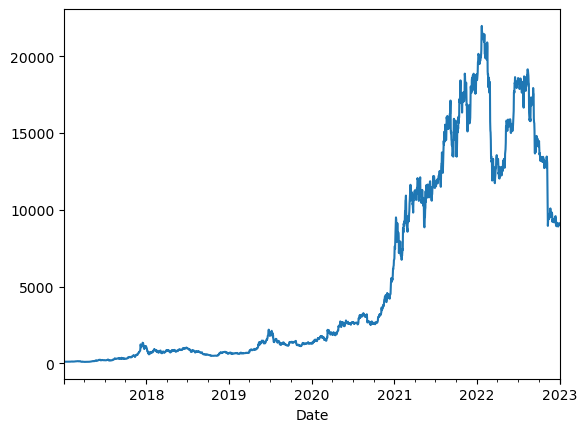

In [88]:
# Initial Indicator
df['fast_ema'] = df.ta.ema(11)
df['slow_ema'] = df.ta.ema(17)

# Define Signal
df['long_trigger'] = df['fast_ema'].vbt.crossed_above(df['slow_ema'])

df['short_trigger'] = df['fast_ema'].vbt.crossed_below(df['slow_ema'])

# Add to VBT
long_entries = df['long_trigger'] 
short_entries = df['short_trigger'] 
long_exits = df['short_trigger'] 
short_exits = df['long_trigger'] 

port = vbt.Portfolio.from_signals(df.Close,
                                entries = long_entries,
                                exits = long_exits,
                                short_entries = short_entries,
                                short_exits = short_exits,
                                fees=0.001)

port.value().plot()

In [89]:
trade_log = port.trades.records_readable
trade_log

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id
0,0,0,0.108647,2017-01-29,919.495972,0.099900,2017-03-18,973.817993,0.105802,5.696200,0.057019,Long,Closed,0
1,1,0,0.108430,2017-03-18,973.817993,0.105591,2017-04-04,1133.250000,0.122878,-17.515603,-0.165882,Short,Closed,1
2,2,0,0.077734,2017-04-04,1133.250000,0.088093,2017-06-29,2539.320068,0.197393,109.014523,1.237501,Long,Closed,2
3,3,0,0.077579,2017-06-29,2539.320068,0.196998,2017-07-21,2667.760010,0.206962,-10.368213,-0.052631,Short,Closed,3
4,4,0,0.069961,2017-07-21,2667.760010,0.186640,2017-09-12,4130.810059,0.288997,101.881415,0.545870,Long,Closed,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,63,0,0.677785,2022-10-09,19446.425781,13.180486,2022-10-25,20095.857422,13.620661,-466.975861,-0.035429,Short,Closed,63
64,64,0,0.632667,2022-10-25,20095.857422,12.713977,2022-11-09,15880.780273,10.047239,-2689.499587,-0.211539,Long,Closed,64
65,65,0,0.631402,2022-11-09,15880.780273,10.027164,2022-12-09,17133.152344,10.817915,-811.595928,-0.080940,Short,Closed,65
66,66,0,0.537927,2022-12-09,17133.152344,9.216379,2022-12-18,16757.976562,9.014562,-220.047990,-0.023876,Long,Closed,66


In [90]:
nav = port.value()
nav

Date
2017-01-03     100.000000
2017-01-04     100.000000
2017-01-05     100.000000
2017-01-06     100.000000
2017-01-07     100.000000
                 ...     
2022-12-30    9079.972709
2022-12-31    9109.547794
2023-01-01    9067.896688
2023-01-02    9033.865312
2023-01-03    9059.964492
Length: 2192, dtype: float64

In [93]:
# find percent change from init value
(nav[-1]/nav[0])

90.59964491525729

In [94]:
print(f"cagr: {(nav[-1]/nav[0])**(1/n)-1 : .2%}")


cagr:  111.96%


In [95]:
port.plot(subplots=['cash', 'assets', 'value']).show()

In [96]:
trade_log = port.trades.records_readable

In [97]:
trade_log

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id
0,0,0,0.108647,2017-01-29,919.495972,0.099900,2017-03-18,973.817993,0.105802,5.696200,0.057019,Long,Closed,0
1,1,0,0.108430,2017-03-18,973.817993,0.105591,2017-04-04,1133.250000,0.122878,-17.515603,-0.165882,Short,Closed,1
2,2,0,0.077734,2017-04-04,1133.250000,0.088093,2017-06-29,2539.320068,0.197393,109.014523,1.237501,Long,Closed,2
3,3,0,0.077579,2017-06-29,2539.320068,0.196998,2017-07-21,2667.760010,0.206962,-10.368213,-0.052631,Short,Closed,3
4,4,0,0.069961,2017-07-21,2667.760010,0.186640,2017-09-12,4130.810059,0.288997,101.881415,0.545870,Long,Closed,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,63,0,0.677785,2022-10-09,19446.425781,13.180486,2022-10-25,20095.857422,13.620661,-466.975861,-0.035429,Short,Closed,63
64,64,0,0.632667,2022-10-25,20095.857422,12.713977,2022-11-09,15880.780273,10.047239,-2689.499587,-0.211539,Long,Closed,64
65,65,0,0.631402,2022-11-09,15880.780273,10.027164,2022-12-09,17133.152344,10.817915,-811.595928,-0.080940,Short,Closed,65
66,66,0,0.537927,2022-12-09,17133.152344,9.216379,2022-12-18,16757.976562,9.014562,-220.047990,-0.023876,Long,Closed,66


In [98]:
(1+trade_log['Return']).cumprod(axis=0)-1

0       0.057019
1      -0.118322
2       0.972756
3       0.868928
4       1.889120
         ...    
63    126.594137
64     99.603025
65     91.460244
66     89.252686
67     89.798592
Name: Return, Length: 68, dtype: float64

In [99]:
trade_log['cumulative_return'] = (1+trade_log['Return']).cumprod(axis=0)-1

In [100]:
trade_log

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id,cumulative_return
0,0,0,0.108647,2017-01-29,919.495972,0.099900,2017-03-18,973.817993,0.105802,5.696200,0.057019,Long,Closed,0,0.057019
1,1,0,0.108430,2017-03-18,973.817993,0.105591,2017-04-04,1133.250000,0.122878,-17.515603,-0.165882,Short,Closed,1,-0.118322
2,2,0,0.077734,2017-04-04,1133.250000,0.088093,2017-06-29,2539.320068,0.197393,109.014523,1.237501,Long,Closed,2,0.972756
3,3,0,0.077579,2017-06-29,2539.320068,0.196998,2017-07-21,2667.760010,0.206962,-10.368213,-0.052631,Short,Closed,3,0.868928
4,4,0,0.069961,2017-07-21,2667.760010,0.186640,2017-09-12,4130.810059,0.288997,101.881415,0.545870,Long,Closed,4,1.889120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,63,0,0.677785,2022-10-09,19446.425781,13.180486,2022-10-25,20095.857422,13.620661,-466.975861,-0.035429,Short,Closed,63,126.594137
64,64,0,0.632667,2022-10-25,20095.857422,12.713977,2022-11-09,15880.780273,10.047239,-2689.499587,-0.211539,Long,Closed,64,99.603025
65,65,0,0.631402,2022-11-09,15880.780273,10.027164,2022-12-09,17133.152344,10.817915,-811.595928,-0.080940,Short,Closed,65,91.460244
66,66,0,0.537927,2022-12-09,17133.152344,9.216379,2022-12-18,16757.976562,9.014562,-220.047990,-0.023876,Long,Closed,66,89.252686


In [101]:
final_ret = trade_log['cumulative_return'].iloc[-1]
cagr = ((1+final_ret)**(1/n)) - 1
cagr

1.1203828894145595

In [ ]:
# re sharpe ratio

# (Rp-Rf) / Sigma

In [182]:
Rp = cagr
Rf= 0.01
sharpe = (Rp-Rf)/sd
sharpe

2.0347650142967613

In [ ]:
# sharpe from per tade -> applied


In [183]:
len(trade_log.index)

68

In [184]:
holding_period = trade_log['Exit Timestamp']-trade_log['Entry Timestamp']
holding_period.mean()

Timedelta('31 days 20:07:03.529411764')

In [185]:
holding_period.mean()/np.timedelta64(1,'Y')

0.0871701275019135

In [186]:
0.01* holding_period.mean()/np.timedelta64(1,'Y')

0.0008717012750191147

In [187]:
Rp=trade_log['Return'].mean()
Rf=0.01*holding_period.mean()/np.timedelta64(1,'Y')
sigma=trade_log['Return'].std()
sharpe=(Rp-Rf)/sigma
sharpe

0.2635541367869417

In [ ]:
# Risk metrics

# for retail is care

In [102]:
trade_log['Return'].mean() #ต่อไม้

0.12587134411734377

In [103]:
trade_log['Return'].max() #ต่อไม้

2.516006587287988

In [104]:
trade_log['Return'].min() #ต่อไม้

-0.23262488855774313

In [105]:
trade_log['Return'].std() #ต่อไม้

0.4742845032380384

# avg win loss
# for institutions 
# for quant  monte. carol in the future

In [106]:
# Volatility
returns = port.returns()

In [107]:
returns

Date
2017-01-03    0.000000
2017-01-04    0.000000
2017-01-05    0.000000
2017-01-06    0.000000
2017-01-07    0.000000
                ...   
2022-12-30    0.002356
2022-12-31    0.003257
2023-01-01   -0.004572
2023-01-02   -0.003753
2023-01-03    0.002889
Length: 2192, dtype: float64

<AxesSubplot:xlabel='Date'>

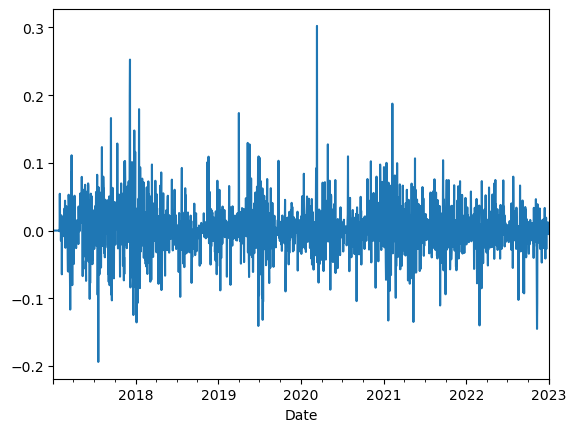

In [108]:
returns.plot()

In [109]:
returns.std()

0.03594610018487244

<AxesSubplot:xlabel='Date'>

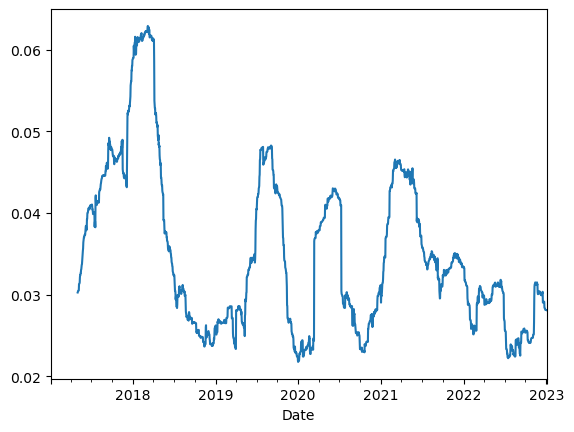

In [114]:
returns.rolling(120).std().plot()
# classic volatility

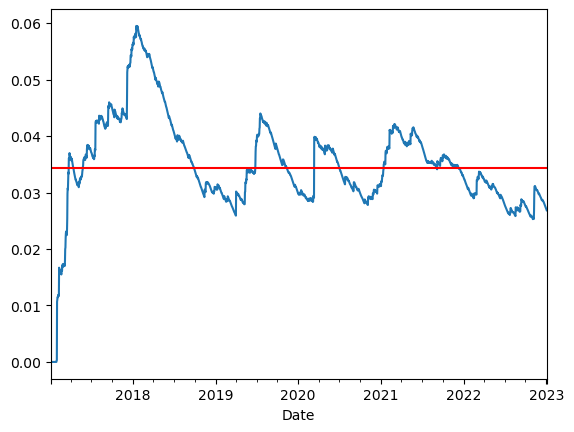

In [112]:
returns.ewm(120).std().plot()
plt.axhline(returns.ewm(span=120).std().mean(),color='red')
# expotential volatility is standard

In [116]:
# volatility is per year is norm
import math
sd = returns.ewm(span=120).std().mean()*math.sqrt(252) 
sd
# and standardivation 

0.5457057112800423

In [118]:
nav.resample('W').last()

Date
2017-01-08     100.000000
2017-01-15     100.000000
2017-01-22     100.000000
2017-01-29      99.900100
2017-02-05     111.616982
                 ...     
2022-12-11    9200.801314
2022-12-18    8996.550962
2022-12-25    8951.450163
2023-01-01    9067.896688
2023-01-08    9059.964492
Freq: W-SUN, Length: 314, dtype: float64

In [119]:
returns.resample('W').prod()

# this is not true result for find week returns must use cumulative return

Date
2017-01-08    0.000000e+00
2017-01-15    0.000000e+00
2017-01-22    0.000000e+00
2017-01-29   -0.000000e+00
2017-02-05   -7.794916e-14
                  ...     
2022-12-11    6.129072e-17
2022-12-18   -1.502354e-14
2022-12-25   -4.477492e-18
2023-01-01   -1.036761e-16
2023-01-08   -1.084242e-05
Freq: W-SUN, Length: 314, dtype: float64

In [121]:
nav.resample('W-FRI').last().pct_change()

Date
2017-01-06         NaN
2017-01-13    0.000000
2017-01-20    0.000000
2017-01-27    0.000000
2017-02-03    0.118962
                ...   
2022-12-09   -0.005195
2022-12-16   -0.028347
2022-12-23    0.002289
2022-12-30    0.011626
2023-01-06   -0.002204
Freq: W-FRI, Length: 314, dtype: float64

In [120]:
# this is right return 
(1+returns).resample('W-FRI').prod()-1

Date
2017-01-06    0.000000
2017-01-13    0.000000
2017-01-20    0.000000
2017-01-27    0.000000
2017-02-03    0.118962
                ...   
2022-12-09   -0.005195
2022-12-16   -0.028347
2022-12-23    0.002289
2022-12-30    0.011626
2023-01-06   -0.002204
Freq: W-FRI, Length: 314, dtype: float64

<AxesSubplot:xlabel='Date'>

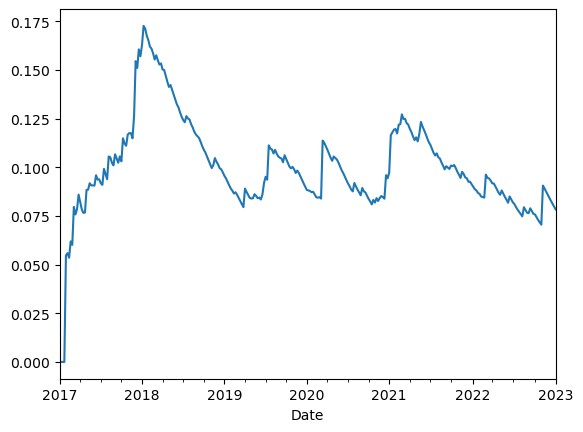

In [124]:
return_weekly.ewm(span=52).std().plot()

In [122]:
return_weekly = (1+returns).resample('W-FRI').prod()-1
sd_weekly = return_weekly.ewm(span=52).std().mean()*math.sqrt(52)
sd_weekly

0.7224984095354975

In [125]:
print(f"Daily Volatility: {sd  :.2%} ")
print(f"Weekly Volatility: {sd_weekly  :.2%} ")

Daily Volatility: 54.57% 
Weekly Volatility: 72.25% 


Risk adjusted performace

Rp = cgar

# maximum dd


<AxesSubplot:xlabel='Date'>

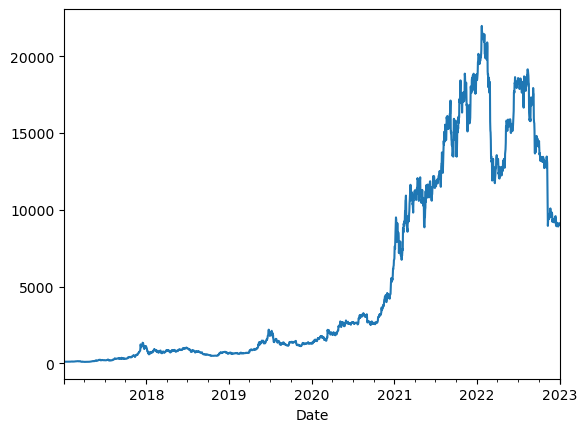

In [128]:
nav.plot()

<AxesSubplot:xlabel='Date'>

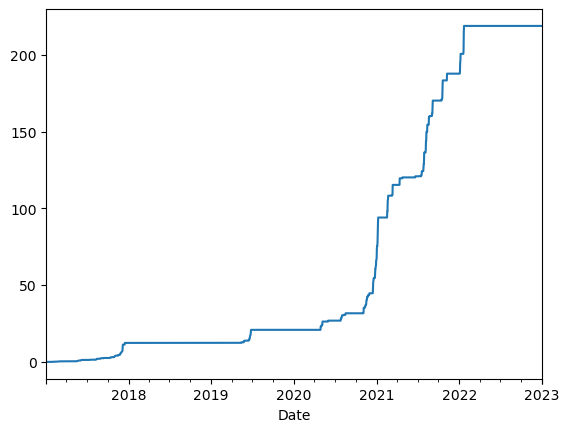

In [127]:
((1+returns).cumprod()-1).cummax().plot()
# this is maximum dd is saling of nav 


In [129]:
cum_r = (1+returns).cumprod()-1

<AxesSubplot:xlabel='Date'>

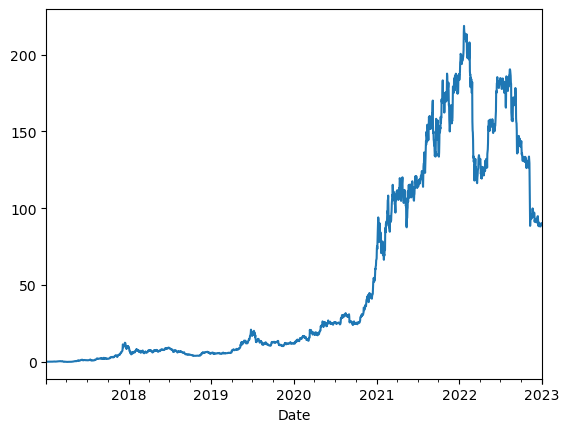

In [130]:
cum_r.plot()

In [131]:
cum_max = cum_r.cummax()

<AxesSubplot:xlabel='Date'>

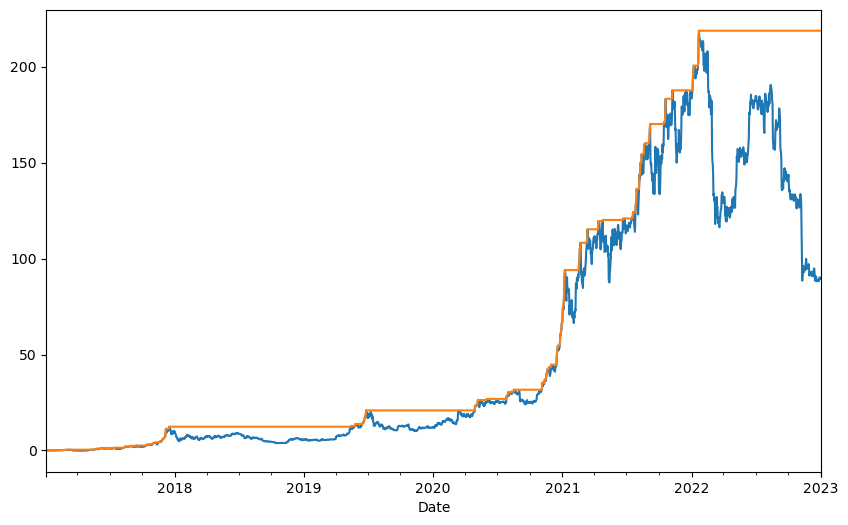

In [132]:
cum_r.plot(figsize=(10,6))
cum_max.plot()

In [143]:
dd = (cum_r/cum_max)-1 # Drawdown
max_dd = dd.iloc[50:].min() # max Drawdown


In [146]:
dd

Date
2017-01-03         NaN
2017-01-04         NaN
2017-01-05         NaN
2017-01-06         NaN
2017-01-07         NaN
                ...   
2022-12-30   -0.589469
2022-12-31   -0.588117
2023-01-01   -0.590021
2023-01-02   -0.591577
2023-01-03   -0.590384
Length: 2192, dtype: float64

<AxesSubplot:xlabel='Date'>

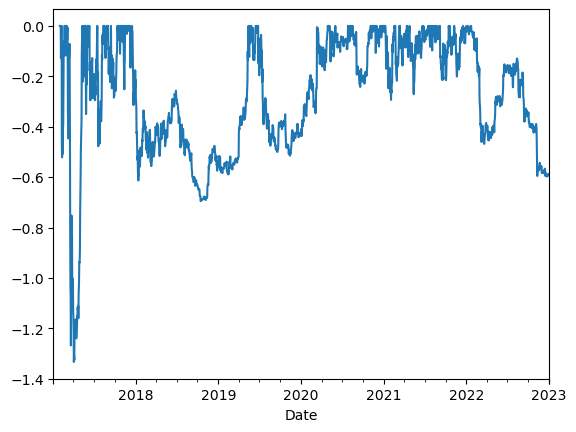

In [144]:
dd.plot()

In [145]:
print(f"max Drawdown:{max_dd:.2%}")

max Drawdown:-133.33%


In [147]:
trade_log

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id,cumulative_return
0,0,0,0.108647,2017-01-29,919.495972,0.099900,2017-03-18,973.817993,0.105802,5.696200,0.057019,Long,Closed,0,0.057019
1,1,0,0.108430,2017-03-18,973.817993,0.105591,2017-04-04,1133.250000,0.122878,-17.515603,-0.165882,Short,Closed,1,-0.118322
2,2,0,0.077734,2017-04-04,1133.250000,0.088093,2017-06-29,2539.320068,0.197393,109.014523,1.237501,Long,Closed,2,0.972756
3,3,0,0.077579,2017-06-29,2539.320068,0.196998,2017-07-21,2667.760010,0.206962,-10.368213,-0.052631,Short,Closed,3,0.868928
4,4,0,0.069961,2017-07-21,2667.760010,0.186640,2017-09-12,4130.810059,0.288997,101.881415,0.545870,Long,Closed,4,1.889120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,63,0,0.677785,2022-10-09,19446.425781,13.180486,2022-10-25,20095.857422,13.620661,-466.975861,-0.035429,Short,Closed,63,126.594137
64,64,0,0.632667,2022-10-25,20095.857422,12.713977,2022-11-09,15880.780273,10.047239,-2689.499587,-0.211539,Long,Closed,64,99.603025
65,65,0,0.631402,2022-11-09,15880.780273,10.027164,2022-12-09,17133.152344,10.817915,-811.595928,-0.080940,Short,Closed,65,91.460244
66,66,0,0.537927,2022-12-09,17133.152344,9.216379,2022-12-18,16757.976562,9.014562,-220.047990,-0.023876,Long,Closed,66,89.252686


In [149]:
trade_log['Return'].min()

-0.23262488855774313

# create 1 Y Drawdown
# cannot use rolling . cummax

<AxesSubplot:xlabel='Date'>

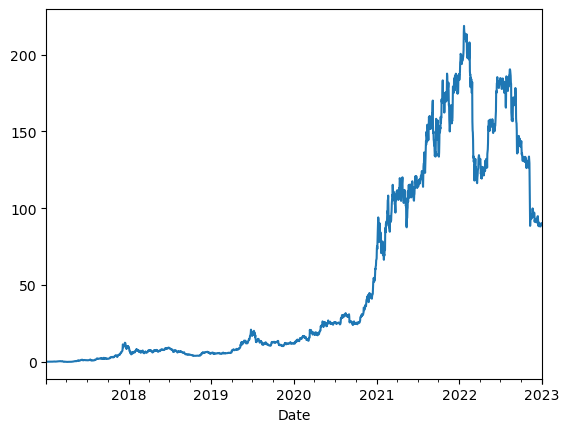

In [150]:
cum_r.plot()

In [151]:
cum_r

Date
2017-01-03     0.000000
2017-01-04     0.000000
2017-01-05     0.000000
2017-01-06     0.000000
2017-01-07     0.000000
                ...    
2022-12-30    89.799727
2022-12-31    90.095478
2023-01-01    89.678967
2023-01-02    89.338653
2023-01-03    89.599645
Length: 2192, dtype: float64

In [153]:
cum_r.rolling(3).max()

Date
2017-01-03          NaN
2017-01-04          NaN
2017-01-05     0.000000
2017-01-06     0.000000
2017-01-07     0.000000
                ...    
2022-12-30    90.068226
2022-12-31    90.095478
2023-01-01    90.095478
2023-01-02    90.095478
2023-01-03    89.678967
Length: 2192, dtype: float64

<AxesSubplot:xlabel='Date'>

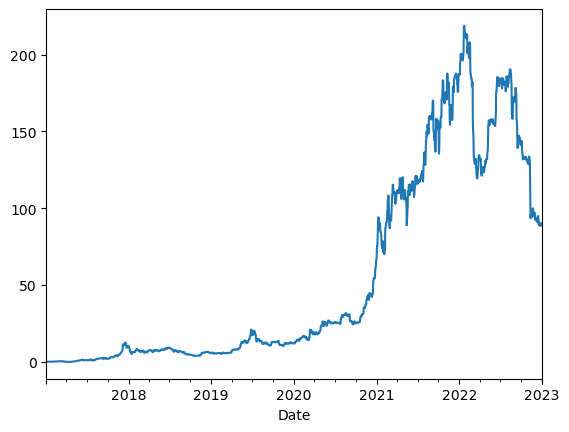

In [154]:
cum_r.rolling(3).max().plot()

In [ ]:
# cum_r != cum_r.rolling

<AxesSubplot:xlabel='Date'>

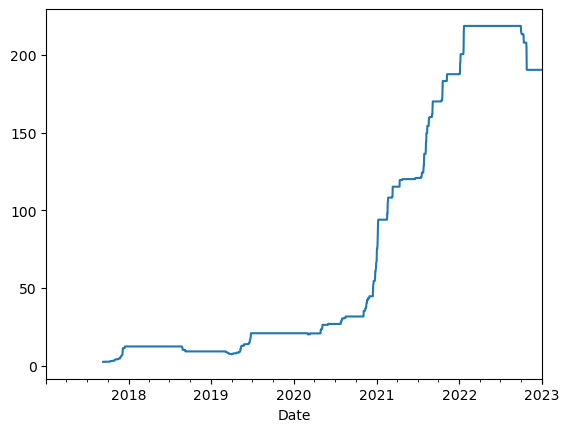

In [157]:
cum_r.rolling(252).max().plot()
#252 is number  of day  trading  in year

In [158]:
dd_annually = cum_r.rolling(252).max()

<AxesSubplot:xlabel='Date'>

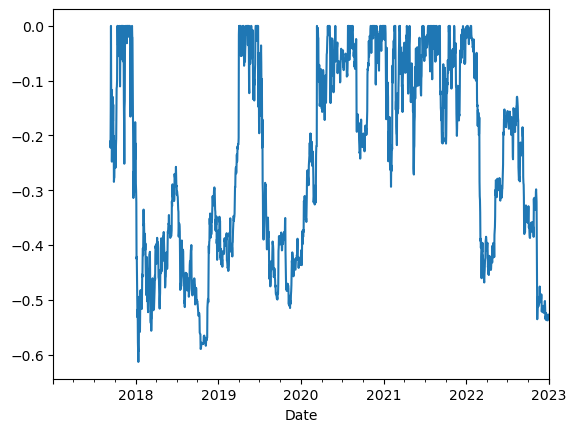

In [159]:
(cum_r/dd_annually-1).plot()

# under water price

In [160]:
(cum_r/dd_annually-1).min()

# max drawdown peryear

-0.6132664136832617

In [162]:
(cum_r/dd_annually-1)
#drawdown peryear

Date
2017-01-03         NaN
2017-01-04         NaN
2017-01-05         NaN
2017-01-06         NaN
2017-01-07         NaN
                ...   
2022-12-30   -0.528518
2022-12-31   -0.526965
2023-01-01   -0.529152
2023-01-02   -0.530938
2023-01-03   -0.529568
Length: 2192, dtype: float64

# pyfolio

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/pos.py:25: UserWarning:

Module "zipline.assets" not found; multipliers will not be applied to position notionals.

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/timeseries.py:734: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



Start date,2017-01-03
End date,2023-01-03
Total months,104
,Backtest
Annual return,67.88%
Cumulative returns,8959.964%
Annual volatility,57.063%
Sharpe ratio,1.19
Calmar ratio,1.06
Stability,0.92
Max drawdown,-64.32%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,64.32,2017-12-16,2018-10-15,2019-05-14,367
1,59.45,2022-01-22,2022-12-26,NaT,NaN
2,49.14,2019-06-26,2019-11-14,2020-04-29,221
3,37.08,2017-03-03,2017-04-03,2017-05-10,49
4,29.05,2021-01-08,2021-02-02,2021-02-17,29


/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/plotting.py:835: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/plotting.py:835: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/plotting.py:835: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



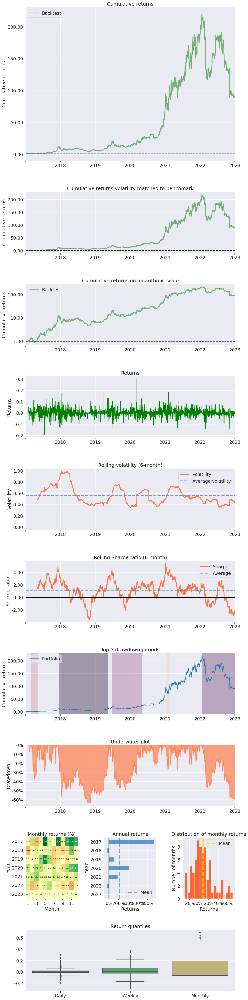

In [163]:
import pyfolio as pf

pf.tears.create_returns_tear_sheet(port.returns())

In [174]:
live_date = returns.index[-180]#.tz_localize('UTC')

In [175]:
live_date

Timestamp('2022-07-08 00:00:00+0000', tz='UTC')

In [176]:
returns.index= returns.index.tz_localize('UTC')

TypeError: Already tz-aware, use tz_convert to convert.

In [177]:
returns.index

DatetimeIndex(['2017-01-03 00:00:00+00:00', '2017-01-04 00:00:00+00:00',
               '2017-01-05 00:00:00+00:00', '2017-01-06 00:00:00+00:00',
               '2017-01-07 00:00:00+00:00', '2017-01-08 00:00:00+00:00',
               '2017-01-09 00:00:00+00:00', '2017-01-10 00:00:00+00:00',
               '2017-01-11 00:00:00+00:00', '2017-01-12 00:00:00+00:00',
               ...
               '2022-12-25 00:00:00+00:00', '2022-12-26 00:00:00+00:00',
               '2022-12-27 00:00:00+00:00', '2022-12-28 00:00:00+00:00',
               '2022-12-29 00:00:00+00:00', '2022-12-30 00:00:00+00:00',
               '2022-12-31 00:00:00+00:00', '2023-01-01 00:00:00+00:00',
               '2023-01-02 00:00:00+00:00', '2023-01-03 00:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Date', length=2192, freq=None)

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/timeseries.py:734: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/timeseries.py:734: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/timeseries.py:734: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,64.32,2017-12-16,2018-10-15,2019-05-14,367
1,59.45,2022-01-22,2022-12-26,NaT,NaN
2,49.14,2019-06-26,2019-11-14,2020-04-29,221
3,37.08,2017-03-03,2017-04-03,2017-05-10,49
4,29.05,2021-01-08,2021-02-02,2021-02-17,29


/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/timeseries.py:1166: FutureWarning:

pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/timeseries.py:1166: FutureWarning:

pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning:

32.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/admin/opt/anaconda3/lib/python3.9/site-packages/pyfolio/timeseries.py:1258: FutureWarning:

Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.



Stress Events,mean,min,max
New Normal,0.27%,-19.40%,30.22%


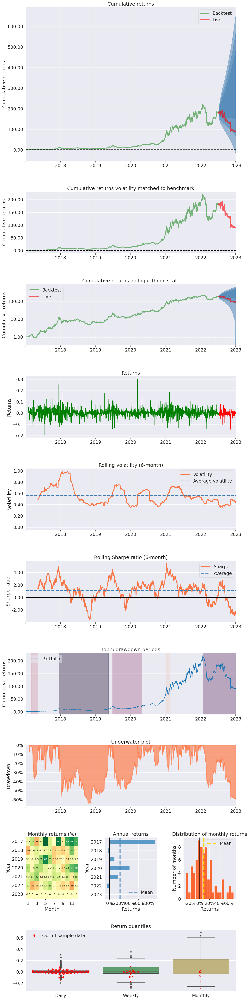

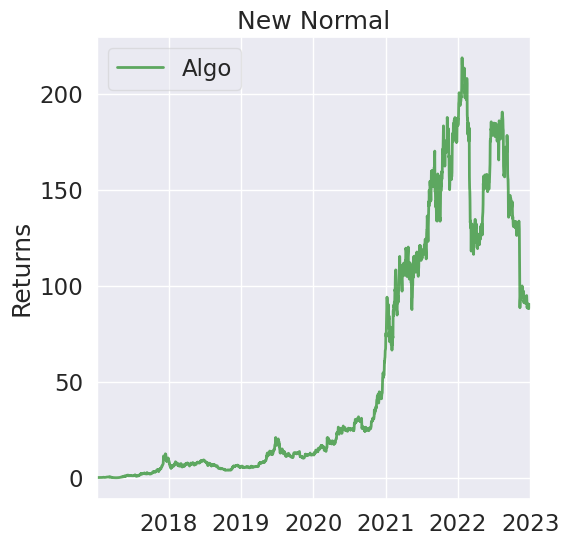

In [178]:
pf.tears.create_full_tear_sheet(returns,live_start_date=live_date)

In [ ]:
# plot_annual_returns
# plot_daily_returns_similarity
# plot_daily_volume
# plot_drawdown_periods
# plot_drawdown_underwater
# plot_exposures
# plot_gross_leverage
# plot_holdings
# plot_long_short_holdings
# plot_monthly_returns_dist
# plot_monthly_returns_heatmap
# plot_multistrike_cones
# plot_prob_profit_trade
# plot_return_quantiles
# plot_rolling_beta
# plot_rolling_returns
# plot_rolling_sharpe
# plot_turnover
# plot_txn_time_hist
# show_and_plot_top_positions

<AxesSubplot:title={'center':'Underwater plot'}, ylabel='Drawdown'>

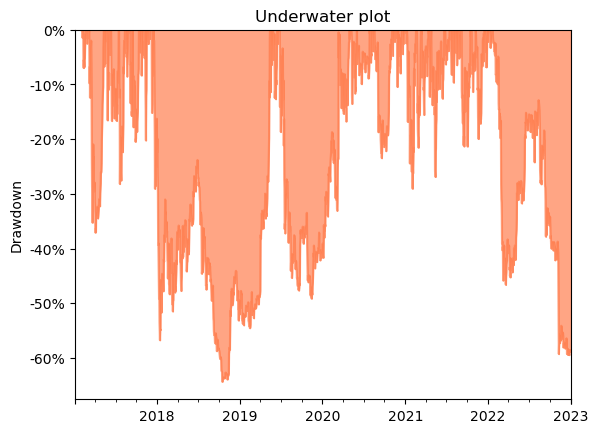

In [179]:
pf.plot_drawdown_underwater(returns)

In [180]:
## https://quantopian.github.io/pyfolio/notebooks/sector_mappings_example/

SyntaxError: invalid syntax (3129942621.py, line 1)